In [1]:
import scanpy as sc
import pandas as pd
from pathlib import Path
import anndata as ad
import numpy as np
import os
import scvi

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

DPI = 300
FONTSIZE = 20  # 42

sc.settings.set_figure_params(
    scanpy=True, dpi=100, transparent=True, vector_friendly=True, dpi_save=DPI
)
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42

Global seed set to 0


In [2]:
DIR2SAVE = Path(
    "/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Stromal/final/"
)

FIG2SAVE = DIR2SAVE.joinpath("figures/after_20mt_sam_annot_merge/")
FIG2SAVE.mkdir(parents=True, exist_ok=True)
# set the global variable: sc.settings.figdir to save all plots
sc.settings.figdir = FIG2SAVE

In [3]:
adata = sc.read_h5ad(
    DIR2SAVE.joinpath("SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Stromal_final.h5ad")
)
adata.shape

(5370, 2000)

In [4]:
adata_all = sc.read_h5ad("/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/final_object/20mt/SMC_KUL_Pelka_Che_Wu_pCRC_annotations.h5ad")

In [5]:
barcodes2keep = adata_all[adata_all.obs.Annotation_scVI=="Stromal"].obs.index
len(barcodes2keep)

5367

In [6]:
# select only barcodees that are in final object (20mt sam + my TME)
adata = adata[adata.obs.index.isin(barcodes2keep)].copy()
adata.shape

(5367, 2000)

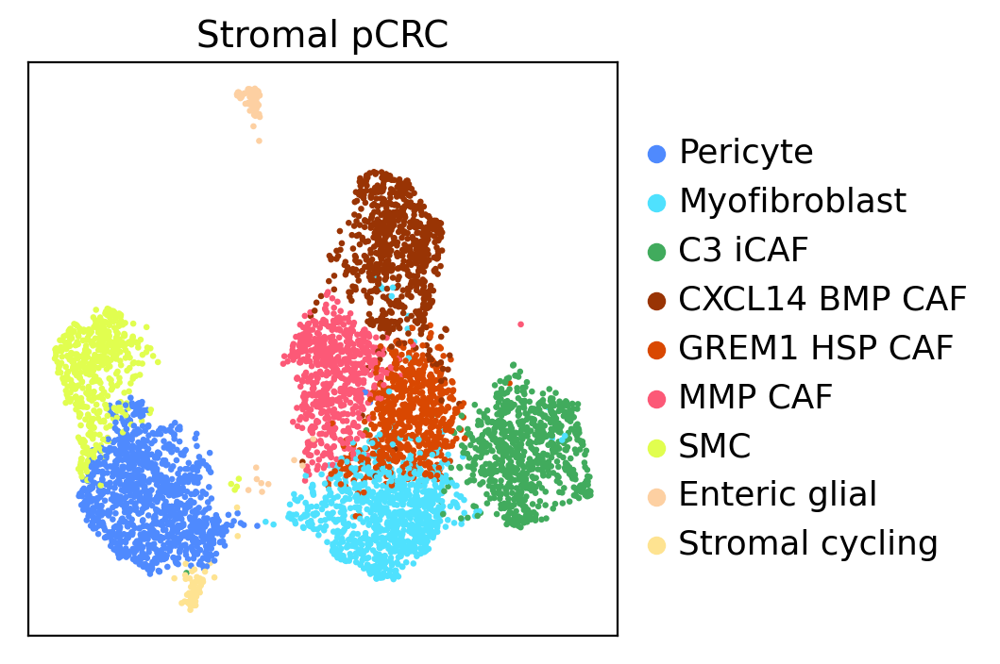

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=1)
sc.pl.umap(
    adata,
    color="Annotation_scVI_detailed",
    show=False,
    legend_loc="right margin",
    title="Stromal pCRC",
    ax=ax
)
ax.set_xlabel("")
ax.set_ylabel("")
plt.savefig(FIG2SAVE.joinpath("Annotation.pdf"), bbox_inches='tight', dpi=DPI)

In [8]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Stromal/final/figures/after_20mt_sam_annot_merge')

In [9]:
from matplotlib.patches import Rectangle


def proportion_cells_patient(
    adata, groupby_labels, xlabel: str, ylabel: str, colors: dict, figname: str, bbox_to_anchor=(1, 0.8)
):  # colors
    # compute proportion of cells within each group
    table2plot = (
        adata.reset_index()
        .groupby(groupby_labels)
        .size()
        .groupby(level=0)
        .apply(lambda x: x * 100 / x.sum())
        .unstack()
    )

    fig, ax = plt.subplots(
        nrows=1,
        ncols=1,
        sharey=False,
        sharex=False,
        dpi=DPI,
    )  # figsize=(4, 4))

    print(table2plot)
    table2plot.plot.barh(stacked=True, ax=ax, color=colors.values())  # , color=colors
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.grid(False, which="major", axis="both")  # removes major horizontal gridlinesd

    labels = list(colors.keys())
    l = [Rectangle((0, 0), 0, 0, color=color) for color in list(colors.values())]
    ax.legend(
        l,
        labels,
        loc="upper left",
        bbox_to_anchor=bbox_to_anchor, #(1, 0.8),
        facecolor="white",
        edgecolor="white",
        ncol=1,
        borderaxespad=0.0,
        framealpha=0,
        frameon=False,
    )

    plt.savefig(FIG2SAVE.joinpath(figname), dpi=DPI, format="pdf", bbox_inches="tight")
    plt.show()

cell_source                     SMC        KUL      Pelka        Che
Annotation_scVI_detailed                                            
Pericyte                  28.797763  15.284250  51.630941   4.287046
Myofibroblast             27.522936  51.376147  13.302752   7.798165
C3 iCAF                    5.874499  20.160214  13.618158  60.347130
CXCL14 BMP CAF            26.458616   9.905020  57.530529   6.105834
GREM1 HSP CAF             54.531722  10.574018  19.335347  15.558912
MMP CAF                   42.563291  13.291139  36.075949   8.069620
SMC                       16.935484  24.395161  35.483871  23.185484
Enteric glial             27.906977  29.069767  27.906977  15.116279
Stromal cycling           33.333333  10.000000  55.000000   1.666667


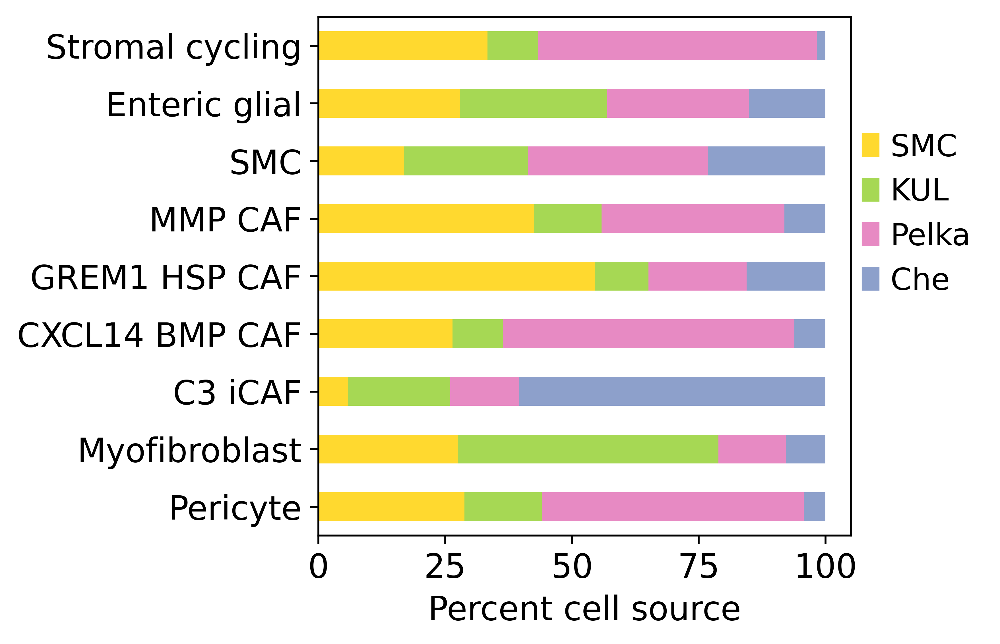

In [10]:
from collections import OrderedDict

color_dict = OrderedDict(
    zip(
        adata.obs["cell_source"].cat.categories.values.tolist(),
        adata.uns["cell_source_colors"],
    )
)

proportion_cells_patient(
    adata.obs,
    groupby_labels=["Annotation_scVI_detailed", "cell_source"],
    xlabel="Percent cell source",
    ylabel="",
    colors=color_dict,
    figname="annotation_cell_source.pdf",
)

Annotation_scVI_detailed   Pericyte  Myofibroblast    C3 iCAF  CXCL14 BMP CAF  \
cell_source                                                                     
SMC                       19.987063      15.523933   2.846054       12.613195   
KUL                       14.360771      39.229422  13.222417        6.392294   
Pelka                     31.036415       6.498599   5.714286       23.753501   
Che                        5.145414       7.606264  50.559284        5.033557   

Annotation_scVI_detailed  GREM1 HSP CAF    MMP CAF        SMC  Enteric glial  \
cell_source                                                                    
SMC                           23.350582  17.399741   5.433376       1.552393   
KUL                            6.129597   7.355517  10.595447       2.189142   
Pelka                          7.170868  12.773109   9.859944       1.344538   
Che                           11.521253   5.704698  12.863535       1.454139   

Annotation_scVI_detailed  Stroma

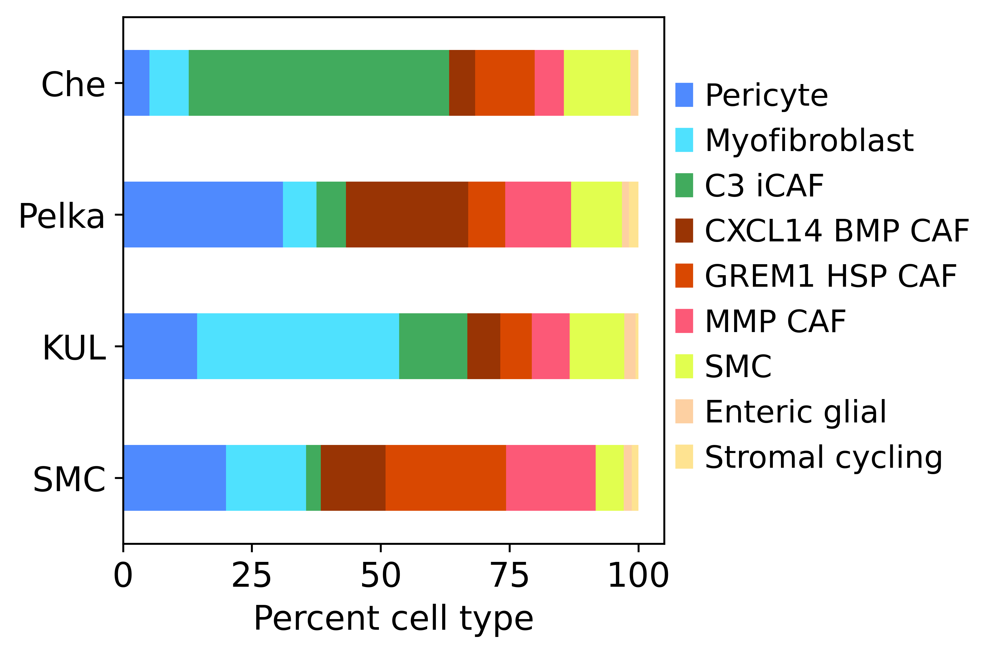

In [11]:
from collections import OrderedDict

color_dict = OrderedDict(
    zip(
        adata.obs["Annotation_scVI_detailed"].cat.categories.values.tolist(),
        adata.uns["Annotation_scVI_detailed_colors"],
    )
)

proportion_cells_patient(
    adata.obs,
    groupby_labels=["cell_source", "Annotation_scVI_detailed"],
    xlabel="Percent cell type",
    ylabel="",
    colors=color_dict,
    bbox_to_anchor=(1,0.9),
    figname="barplot_annotation_across_cell_source.pdf",
)

In [12]:
FIG2SAVE

PosixPath('/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Stromal/final/figures/after_20mt_sam_annot_merge')

In [13]:
markers_specific = {
    "Enteric glial": ["S100B", "PLP1"],
    "Pericyte": ["PDGFRB", "RGS5", "TAGLN", "ACTA2", "ABCC9"],
    "SMC": ["TAGLN", "ACTA2", "MYH11", "DES"],  # smooth muscle cell
    "Myofibro": ["TAGLN", "ACTA2", "COL1A1"],
    #"Fibro": ["COL3A1", "DCN", "THY1", "SRPX", "C7"],
    #"CAF": ["FAP", "PDPN"],
    #"Inflammatory": ["IL6", "IL11", "PDGFRA"],
    "Immune-regulatory": ["CXCL12", "CXCL14"],
    "C3 CD34 iCAF": [
        "C3",
        "CD34",
        "CXCL12",
        "CFB",
        "SERPING1",
        "SFRP1",
        "SFRP2",
        "FBLN5",
        "RSPO3",
        "TGFBR3",
    ],
    "CXCL14 BMP": [
        "CXCL14",
        "BMP4",
        "BMP5",
        "WNT4",
        "BMP7",
        "PDGFRA",
        "C2",
        "CSF1",
        "TGFBR2",
    ],
    "GREM1": ["GREM1", "SFRP4", "VCAN"],
    "ECM": ["MMP14",
            "LAMA2",
            "COL3A1",
            "COL1A2",
            "LUM",
            "COL12A1",
            "CTSB", 
            "TGFBR1", 
            "POSTN", 
            "COL16A1", 
            "ECM1", 
            "SERPINE1",
            "FBN1",
            "FBLN2"
            ],
    "MMP": [
        "MMP3",
        "MMP1",
        "CXCL5",
        "CXCL13",
        "CXCL6",
        "MMP9",
        "MMP13",
        "CXCL1",
        "CXCL8",
        "COL7A1",
        "BAMBI",
        "IL6",
        "IL11",
        #"TGFBR1",
    ],
    "Cycling" : ["MKI67"]
    #"CCL8": ["CCL8", "TGFB1", "IL34", "C2", "CCL13", "CXCL14", "APOE", "CCL2"],
}

In [14]:
# markers Stromal not Fibro 
markers_stroma_not_caf = {
    "Enteric glial": ["S100B", "PLP1"],
    "Pericyte": ["PDGFRB", "RGS5", "ABCC9"], # "TAGLN", "ACTA2"
    "SMC": ["TAGLN", "ACTA2", "MYH11", "DES"],  # smooth muscle cell
    "Cycling" : ["MKI67"]
    #"CCL8": ["CCL8", "TGFB1", "IL34", "C2", "CCL13", "CXCL14", "APOE", "CCL2"],
}
# markers for fibro type
markers_specific_caf = {
    "Myofibro": ["TAGLN", "ACTA2", "COL1A1"],
   # "Fibro": ["COL3A1", "DCN", "THY1", "SRPX", "C7"],
   #"CAF": ["FAP", "PDPN"],
   # "Inflammatory": ["IL6", "IL11", "PDGFRA"],
    "Immune-regulatory": ["CXCL12", "CXCL14"],
    "C3 CD34 iCAF": [
        "C3",
        "CD34",
        "CXCL12",
        "CFB",
        "SERPING1",
        "SFRP1",
        "SFRP2",
        "FBLN5",
        "RSPO3",
        "TGFBR3",
    ],
    "CXCL14 BMP": [
        "CXCL14",
        "BMP4",
        "BMP5",
        "WNT4",
        "BMP7",
        #"PDGFRA",
        #"C2",
        "CSF1",
        #"TGFBR2",
    ],
    "GREM1": ["GREM1", "SFRP4", "VCAN"],
    "MMP": [
        "MMP3",
        "MMP1",
        "CXCL5",
        "CXCL13",
        "CXCL6",
        "MMP9",
        "MMP13",
        "CXCL1",
        "CXCL8",
        "COL7A1",
        "BAMBI",
        "IL6",
        "IL11",
        "TGFBR1",
    ]
}

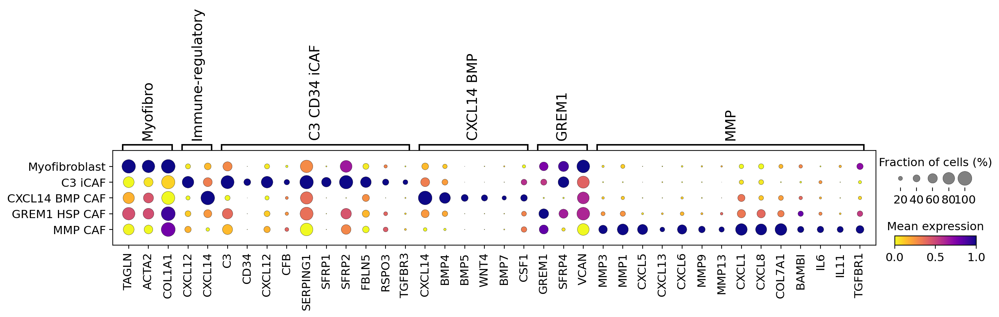

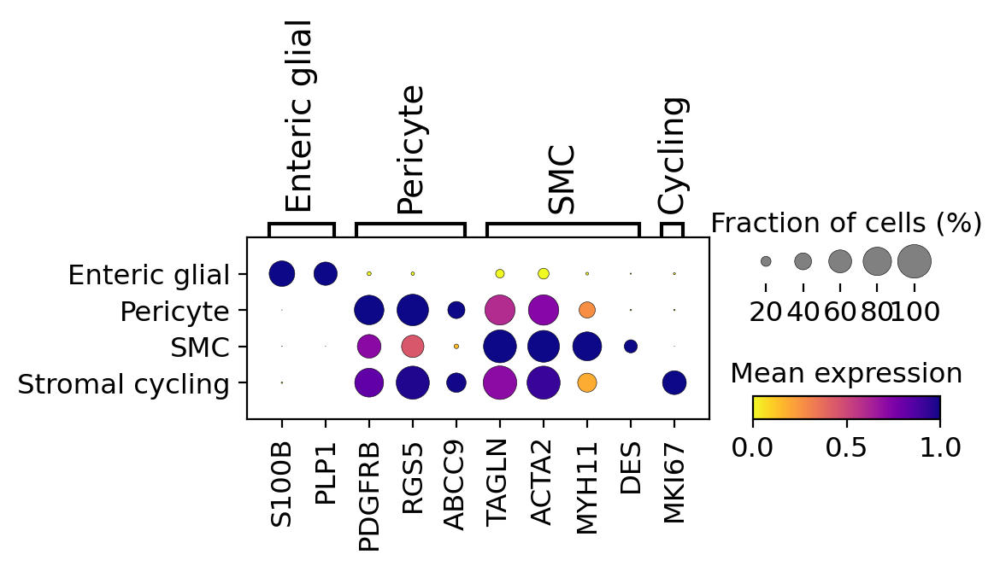

In [15]:
sc.pl.dotplot(
    adata[adata.obs.Annotation_scVI_detailed.str.contains("CAF|Myofibroblast")],
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_specific_caf,
    categories_order=["Myofibroblast", "C3 iCAF", 
                      "CXCL14 BMP CAF", "GREM1 HSP CAF", "MMP CAF",
                     ],
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="Stromal_dotplot_mean_CAF_annotations.pdf",
    show=True,
)

sc.pl.dotplot(
    adata[~adata.obs.Annotation_scVI_detailed.str.contains("CAF|Myofibroblast")],
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_stroma_not_caf,
    categories_order=["Enteric glial", "Pericyte", "SMC", "Stromal cycling"
                     ],
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="Stromal_dotplot_mean_Pericyte_SMC_cycling_annotations.pdf",
    show=True,
)

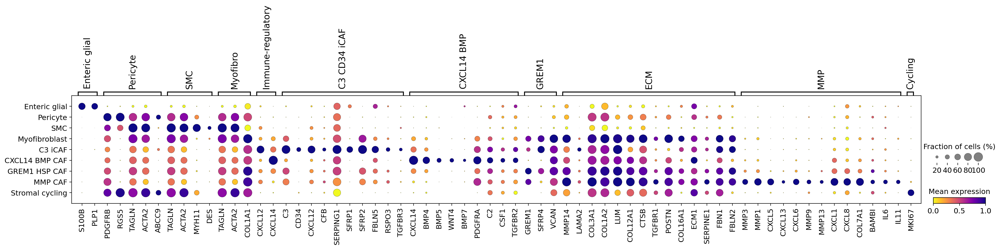

In [16]:
sc.pl.dotplot(
    adata,
    groupby="Annotation_scVI_detailed",
    use_raw=True,
    var_names=markers_specific,
    categories_order=["Enteric glial", "Pericyte", "SMC", "Myofibroblast", "C3 iCAF", 
                      "CXCL14 BMP CAF", "GREM1 HSP CAF", "MMP CAF", "Stromal cycling"
                     ],
    cmap="plasma_r",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    size_title = "Fraction of cells (%)",
    dendrogram=False,
    save="Stromal_dotplot_mean_general_annotations.pdf",
    show=True,
)

### zscore

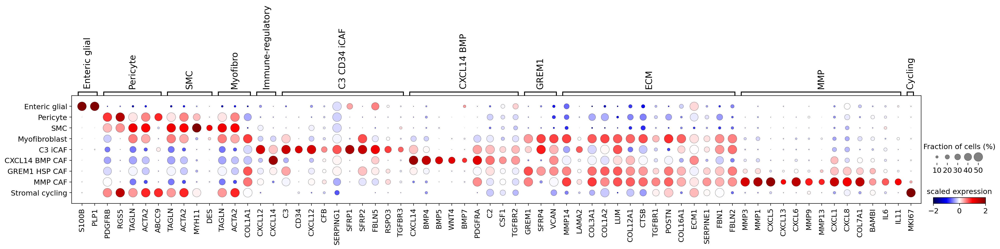

In [17]:
adata_zscore = adata.raw.to_adata().copy()
# scale and store results in layer for later plotting
adata_zscore.layers['scaled'] = sc.pp.scale(adata_zscore, copy=True).X
adata_zscore.obs=adata.obs
sc.pl.dotplot(adata=adata_zscore, 
              var_names=markers_specific,
              categories_order=["Enteric glial", "Pericyte", "SMC", "Myofibroblast", "C3 iCAF", 
                      "CXCL14 BMP CAF", "GREM1 HSP CAF", "MMP CAF", "Stromal cycling"
                     ],
              groupby="Annotation_scVI_detailed",
              cmap="seismic", 
              layer="scaled", 
              vmin=-2,
              vmax=2, 
              dot_max=0.5, 
              colorbar_title = "scaled expression", 
              size_title="Fraction of cells (%)",
              save='zscore_general.pdf')

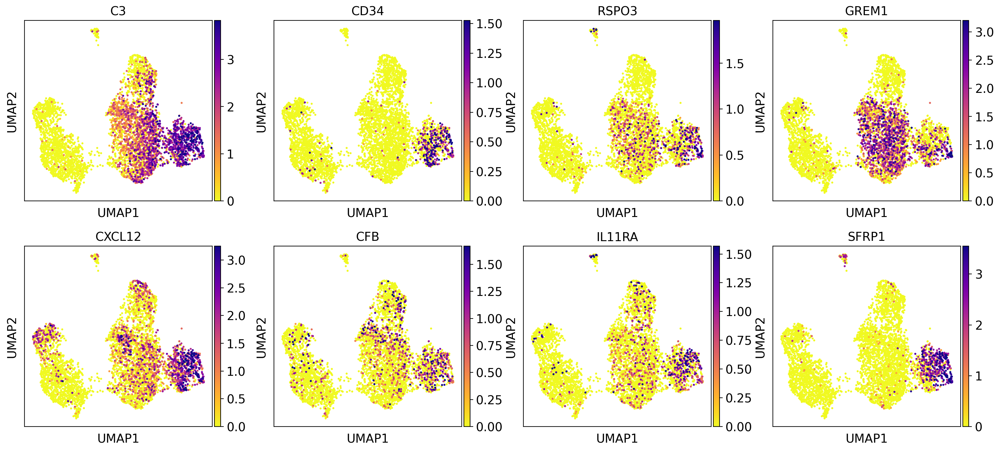

In [18]:
# use log1p data stored in .raw
markers2plot = ["C3", "CD34", "RSPO3", "GREM1", "CXCL12", "CFB", "IL11RA", "SFRP1"]
sc.pl.umap(
    adata,
    color=markers2plot,
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="C3icaf_markers.pdf",
    show=True,
)

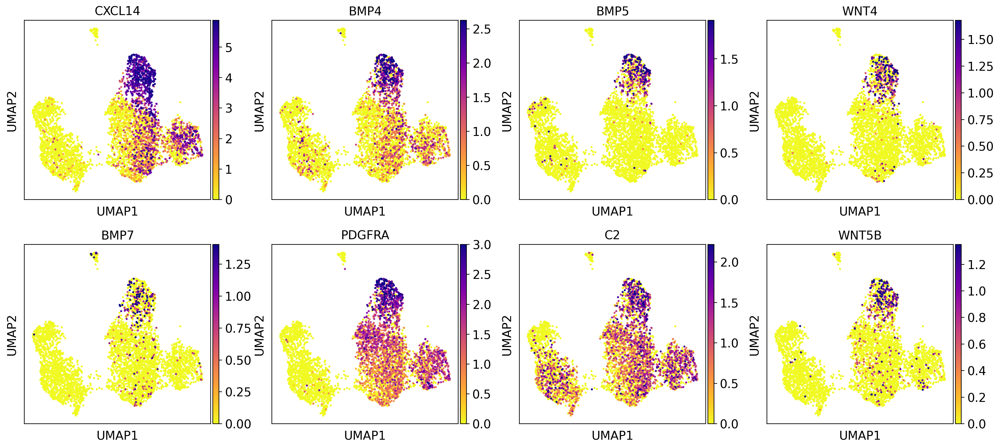

In [19]:
# use log1p data stored in .raw
markers2plot = ["CXCL14", "BMP4", "BMP5", "WNT4", "BMP7", "PDGFRA", "C2", "WNT5B"]
sc.pl.umap(
    adata,
    color=markers2plot,
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="BMP_markers.pdf",
    show=True,
)

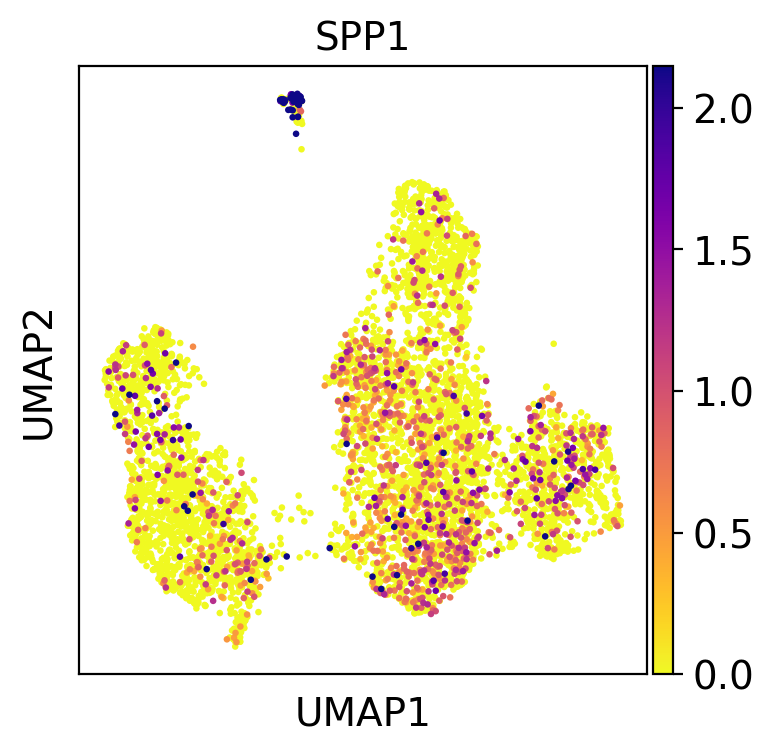

In [7]:
# use log1p data stored in .raw
sc.pl.umap(
    adata,
    color="SPP1",
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="SPP1_marker.pdf",
    show=True,
)

8


/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


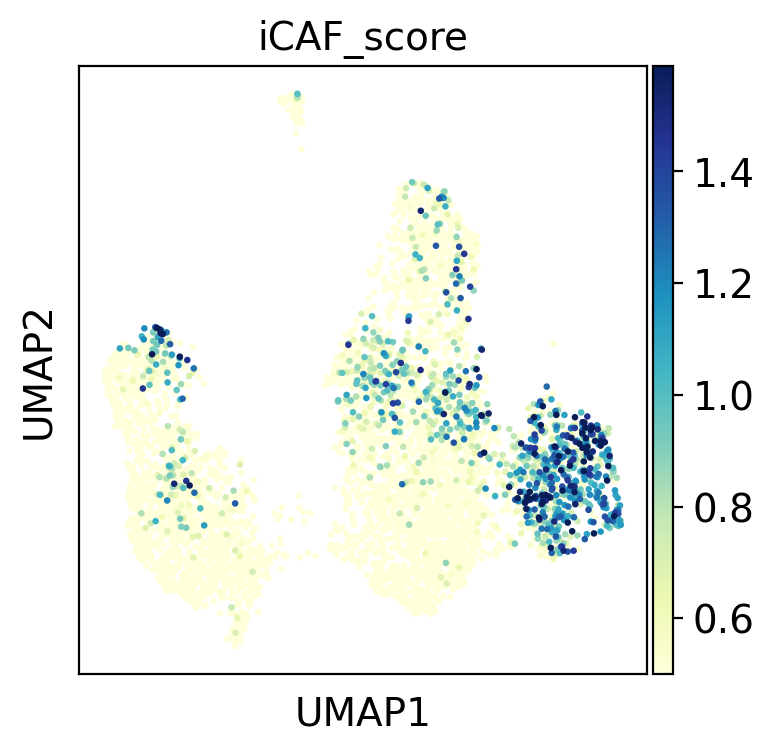

length of gene list in adata.var: 8
8


/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


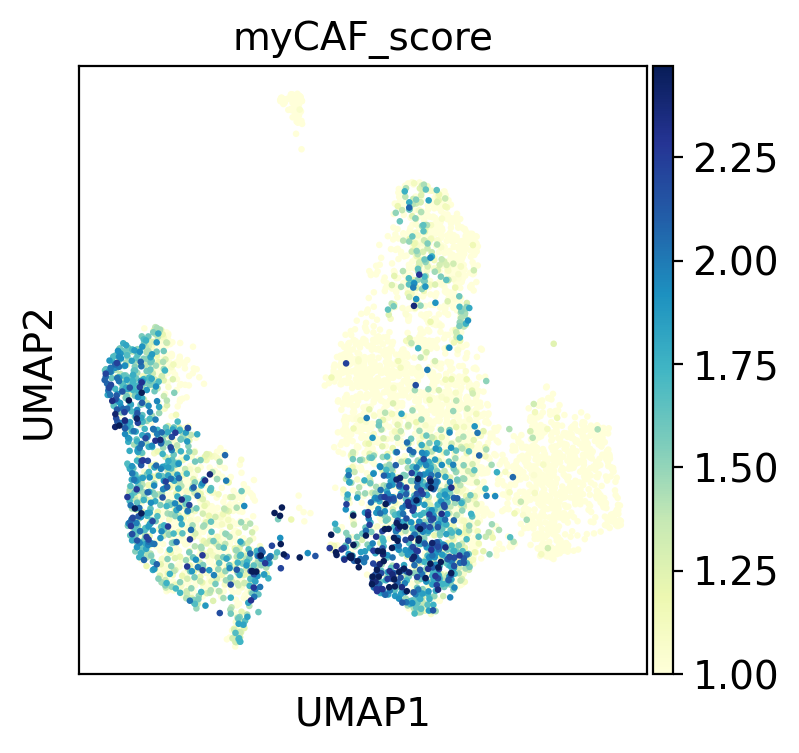

length of gene list in adata.var: 8


In [20]:
# from https://aacrjournals.org/cancerdiscovery/article/9/8/1102/42174/Cross-Species-Single-Cell-Analysis-of-Pancreatic
icaf_markers = ["IL6", "CXCL12", "CFD", "DPT", "LMNA", "CXCL2", "CCL2", "IL1R1"]
mycaf_markers = ["ACTA2", "TAGLN", "MMP11", "MYL9", "HOPX", "POSTN", "TPM1", "TPM2"]

# see https://aacrjournals.org/cancerdiscovery/article/9/2/282/10645/IL1-Induced-JAK-STAT-Signaling-Is-Antagonized-by

# score for iCAFs and myCAFs
print(len(icaf_markers))
icaf_markers_var = [
    gene for gene in icaf_markers if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=icaf_markers_var, score_name="iCAF_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="iCAF_score",
    vmax="p99",
    use_raw=True,
    vmin=0.5,
    save="iCAF_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(icaf_markers_var))


print(len(mycaf_markers))
mycaf_markers_var = [
    gene for gene in mycaf_markers if gene in adata.raw.to_adata().var_names
]
sc.tl.score_genes(
    adata, gene_list=mycaf_markers_var, score_name="myCAF_score", use_raw=True
)
sc.pl.umap(
    adata,
    color="myCAF_score",
    vmax="p99",
    use_raw=True,
    vmin=1,
    save="myCAF_score.pdf",
    show=True,
    color_map="YlGnBu",
)
print("length of gene list in adata.var:", len(mycaf_markers_var))

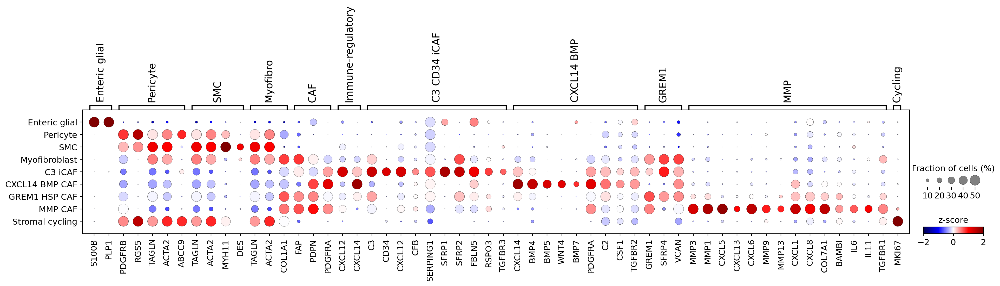

In [21]:
markers_specific_withCAF = {
    "Enteric glial": ["S100B", "PLP1"],
    "Pericyte": ["PDGFRB", "RGS5", "TAGLN", "ACTA2", "ABCC9"],
    "SMC": ["TAGLN", "ACTA2", "MYH11", "DES"],  # smooth muscle cell
    "Myofibro": ["TAGLN", "ACTA2", "COL1A1"],
    #"Fibro": ["COL3A1", "DCN", "THY1", "SRPX", "C7"],
    "CAF": ["FAP", "PDPN", "PDGFRA"],
    #"Inflammatory": ["IL6", "IL11", "PDGFRA"],
    "Immune-regulatory": ["CXCL12", "CXCL14"],
    "C3 CD34 iCAF": [
        "C3",
        "CD34",
        "CXCL12",
        "CFB",
        "SERPING1",
        "SFRP1",
        "SFRP2",
        "FBLN5",
        "RSPO3",
        "TGFBR3",
    ],
    "CXCL14 BMP": [
        "CXCL14",
        "BMP4",
        "BMP5",
        "WNT4",
        "BMP7",
        "PDGFRA",
        "C2",
        "CSF1",
        "TGFBR2",
    ],
    "GREM1": ["GREM1", "SFRP4", "VCAN"],
    "MMP": [
        "MMP3",
        "MMP1",
        "CXCL5",
        "CXCL13",
        "CXCL6",
        "MMP9",
        "MMP13",
        "CXCL1",
        "CXCL8",
        "COL7A1",
        "BAMBI",
        "IL6",
        "IL11",
        "TGFBR1",
    ],
    "Cycling" : ["MKI67"]
    #"CCL8": ["CCL8", "TGFB1", "IL34", "C2", "CCL13", "CXCL14", "APOE", "CCL2"],
}
sc.pl.dotplot(adata=adata_zscore, 
              var_names=markers_specific_withCAF,
              categories_order=["Enteric glial", "Pericyte", "SMC", "Myofibroblast", "C3 iCAF", 
                      "CXCL14 BMP CAF", "GREM1 HSP CAF", "MMP CAF", "Stromal cycling"
                     ],
              groupby="Annotation_scVI_detailed",
              cmap="seismic", 
              layer="scaled", 
              vmin=-2,
              vmax=2, 
              dot_max=0.5, 
              colorbar_title = "z-score", 
              size_title="Fraction of cells (%)",
              save='zscore_markers_withCAF.pdf')

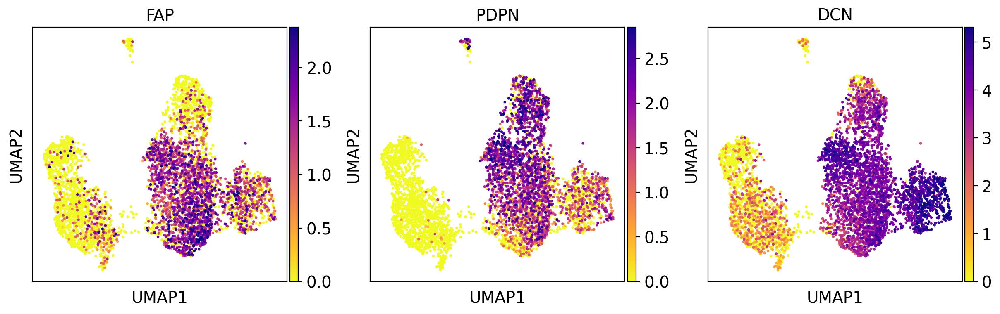

In [15]:
 markers_other = {
   # "cycling": ['MKI67'],
    "CAF": ["FAP", "PDPN", "DCN"],
}

import itertools

# use log1p data stored in .raw
markers2plot_other = list(
    itertools.chain(*list(markers_other.values()))
)  # get all markers in a single list
sc.pl.umap(
    adata,
    color=markers2plot_other,
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="plasma_r",  #'RdPu',
    save="general_markers_for_caf_cycling.pdf",
    show=True,
)

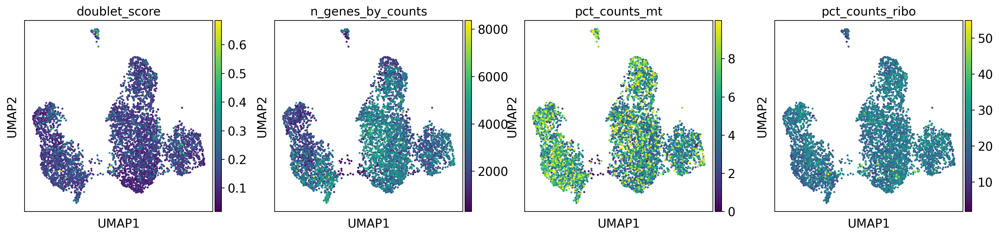

In [16]:
sc.pl.umap(
    adata,
    color=["doublet_score", "n_genes_by_counts", "pct_counts_mt", "pct_counts_ribo"],
    color_map="viridis",
    save="QC_covariates.pdf",
)

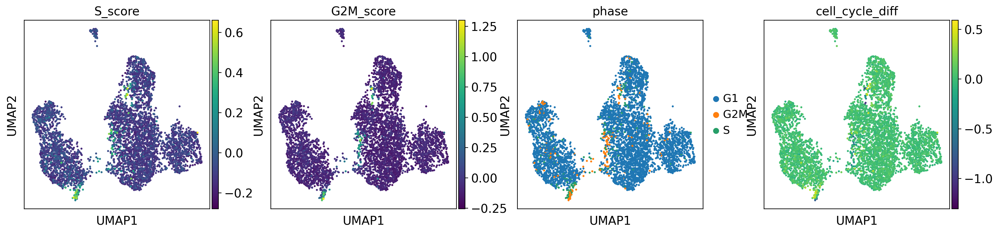

In [17]:
sc.pl.umap(
    adata,
    color=["S_score", "G2M_score", "phase", "cell_cycle_diff"],
    color_map="viridis",
    save="cell_cycle.pdf",
)